# Data Exploration

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
plt.style.use("seaborn-v0_8")

DATA_FOLDER = "data/"

---
---

### Dataset Information
- Two different datasets are provided:
    - *'Properties'* includes the different chemical/physical properties of the materials
    - *'Formula'* includes the chemical formula of each material (one column for each chemical element)
- Each row describes a single superconductor
- The Properties features are 8 basic chemical properties (absolute value, average, weighted average, and so on):
    - atomic mass
    - ionization energy
    - atomic radius
    - density
    - electron affinity energy
    - specific heat of melting
    - thermal conductivity
    - valence

### Target feature
- The target is the critical temperature of the superconductor (last column)
- The values distribution is not uniform and has its peak near the value of 0 (see plot below)

### Other Features
- All features are numerical, except the formula ("*material*") written in plain text, which will be removed because useless
- No null values
- No strictly-duplicated rows are present. Some lines are the same except for the formula. Since the documentation says that each row is a single superconductor, no duplicated rows are removed
- There are present many highly correlated features among the Properties dataset. There will be tests with and without these features (see correlation matrix below)
    - Mainly the high correlation is between the different metrics of the same property, e.g. 'mean_\*' and 'wtd_mean_\*', or 'entropy_\*' and 'wtd_entropy_\*
- The feature values belong to different ranges and they present different value distributions, thus scaling techniques will be tried (see plots matrix below)

---

In [ ]:
print("Shapes of Properties df: ", pd.read_csv(DATA_FOLDER + "train.csv").shape)
print("Shapes of Formula df: ", pd.read_csv(DATA_FOLDER + "formula_train.csv").shape)
df = pd.concat(
    [
        pd.read_csv(DATA_FOLDER + "formula_train.csv").drop(columns=["critical_temp"]),
        pd.read_csv(DATA_FOLDER + "train.csv"),
    ],
    axis=1,
)
print("Shapes of Properties+Formula df: ", df.shape)

Shapes of Properties df:  (17010, 82)
Shapes of Formula df:  (17010, 88)
Shapes of Properties+Formula df:  (17010, 169)


In [ ]:
display(df.head(5))
df.info()
display(df.describe())

,H,He,Li,Be,B,C,N,O,F,Ne,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17010 entries, 0 to 17009
Columns: 169 entries, H to critical_temp
dtypes: float64(156), int64(12), object(1)
memory usage: 21.9+ MB


,H,He,Li,Be,B,C,N,O,F,Ne,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,17010.000000,17010.0,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.0,...,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000,17010.000000
mean,0.018447,0.0,0.011884,0.035189,0.141945,0.376868,0.012462,3.010023,0.015318,0.0,...,3.151430,3.055206,3.054358,1.295344,1.052631,2.042034,1.482988,0.839731,0.673590,34.502993
std,0.287419,0.0,0.125699,0.861767,1.107689,4.357716,0.123290,3.796711,0.136147,0.0,...,1.192035,1.045869,1.175579,0.393231,0.380725,1.244305,0.980906,0.485728,0.454975,34.334793
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,2.117647,2.245649,2.091629,1.060857,0.779166,1.000000,0.920000,0.451754,0.307467,5.330000
50%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,...,2.605455,2.615321,2.429201,1.368922,1.168512,2.000000,1.062857,0.800000,0.500000,20.000000
75%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,6.800000,0.000000,0.0,...,4.019566,3.722419,3.914868,1.589027,1.331531,3.000000,1.912000,1.200000,1.020735,63.000000
max,14.000000,0.0,2.600000,40.000000,105.000000,120.000000,5.000000,66.000000,4.000000,0.0,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


---
### Plot Target feature

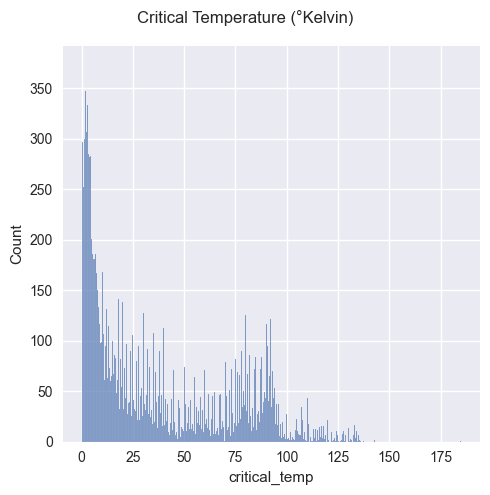

In [ ]:
sns.displot(df["critical_temp"], bins=500).figure.suptitle("Critical Temperature (°Kelvin)")
plt.tight_layout()
plt.show()

---
### Correlation matrix of only the Properties features

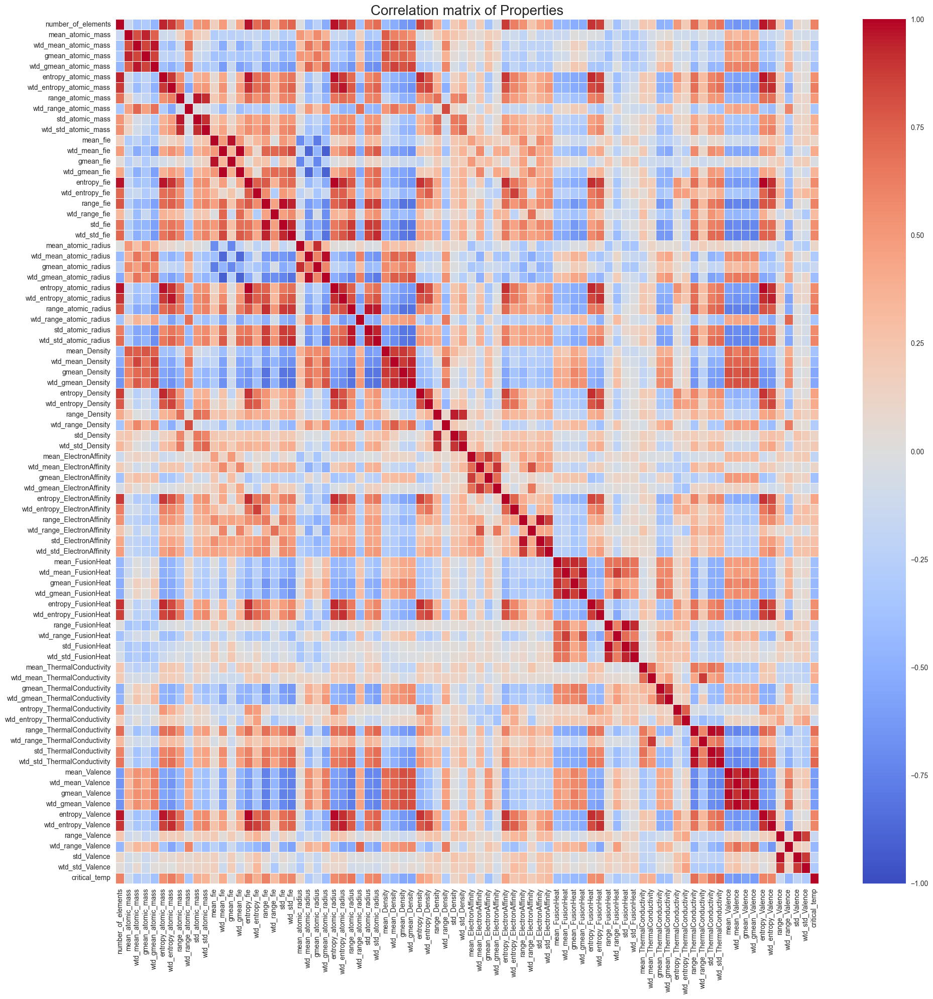

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(
    df.drop(columns="material").iloc[:, 86:].corr(),
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    vmin=-1,
    vmax=1,
)
plt.title("Correlation matrix of Properties", fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

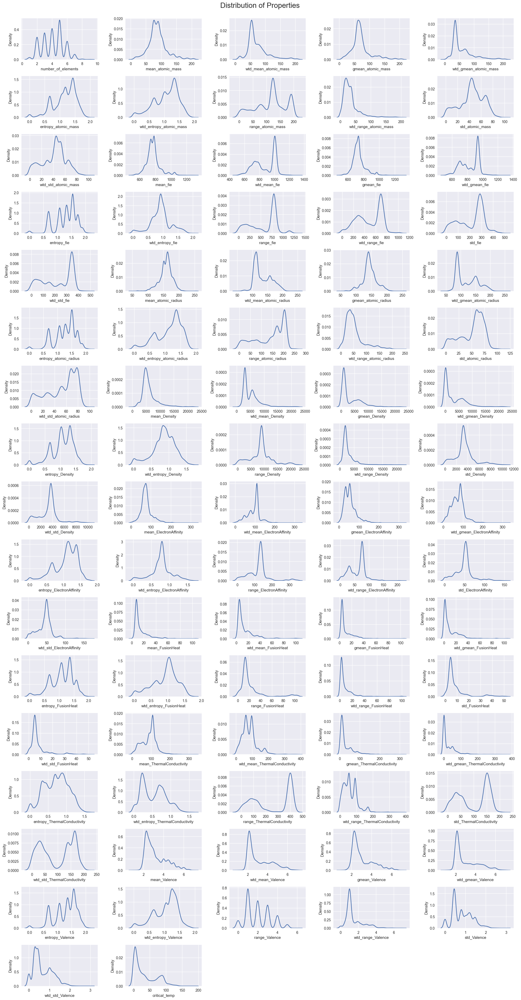

In [ ]:
# Distribution of Properties
pos = 1
fig = plt.figure(figsize=(20, 40))
fig.suptitle("Distribution of Properties", y=1, fontsize=20)

for col in df.drop(columns="material").columns[86:]:
    plt.subplot(18, 5, pos)
    plt.xlabel(col)
    sns.kdeplot(df[col])
    pos = pos + 1

plt.tight_layout()
plt.show()

# Training

- Different models are trained:
    - Linear Regression
    - Random Forest
    - XGBoost
    - KNN
    - SVM

- Using several preprocessing configurations and combinations:
    - Removing highly correlated features
    - StandardScaler, MinMaxScaler
    - Normalizer L1, L2, Max
    - PCA
    - Train only on Properties or Formula dataset

- Using **3** fold cross validation

- To compare in detail the results of different hyperparameter configurations, it is developed a system based on GridSearchcv[*](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) and Pipeline[*](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) that executes a single configuration at each run, and saves it into a csv file. A different csv file is generated for each model.
    - This way all the tested configurations are saved, thus it's easier to remember which configurations are already tested, and it's easier to follow the more promising paths in terms of hyperparameter combinations
    - The program execution can be stopped at any time without losing the already trained configuration results
    - '*utils/Combinations.py*' contains the logic of managing multiple hyperparameter combinations
    - '*utils/Search.py*' contains the logic of executing the GridSearchcv, given a list of 'Combination' instances
    - '*utils/Custom_Steps.py*' contains some custom 'Steps', which are classes that provide the fit and transform methods, to be used as "transformer" steps into the Pipeline class

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import hiplot as hip

from sklearn.model_selection import train_test_split

from sklearn import preprocessing
from sklearn.decomposition import PCA

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor

from utils.Combinations import Step, Pipe, extract_combinations
from utils.Search import grid_search, print_results, best_hyperparameters

from utils.Custom_Steps import HighCorrFeaturesRemover, OnlyFormula, OnlyProperties

In [ ]:
plt.style.use("seaborn-v0_8")

DATA_FOLDER = "data/"
OUTPUT_FOLDER = "outputs/"

RANDOM_STATE = 42

---
---
## Data Load

In [ ]:
df = pd.concat(
    [
        pd.read_csv(DATA_FOLDER + "formula_train.csv").drop(columns=["critical_temp"]),
        pd.read_csv(DATA_FOLDER + "train.csv"),
    ],
    axis=1,
)

# Remove "material" feature (as explained in '0_DataExploration.ipynb')
df = df.drop(columns="material")

print("Shapes of Properties+Formula df: ", df.shape)

Shapes of Properties+Formula df:  (17010, 168)


---
---
## Split
- Since GridSearchcv does cross validation, only a train-test split is needed
- The split is 20% test set and 80% train set

In [ ]:
train, test = train_test_split(df, test_size=0.2, random_state=RANDOM_STATE)

X_train = train.drop(columns=["critical_temp"])
y_train = train[["critical_temp"]]

X_test = test.drop(columns=["critical_temp"])
y_test = test[["critical_temp"]]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((13608, 167), (3402, 167), (13608, 1), (3402, 1))

---
---
## Preprocessing

#### Removing Highly Correlated Features
- It uses the absolute value of the correlation between features
- The threshold depends on the "corr_threshold" parameter, which means that features with a correlation higher than the set value will be removed

In [ ]:
high_corr_features_remover_step = Step(
    "high_corr_features_remover",
    HighCorrFeaturesRemover(),
    {"corr_threshold": [0.85, 0.95, 0.99]},
)

#### Only Properties and Only Formula datasets
- To test which dataset is the most important
- To test if a model performs better with less features, since the datasets combined have 167 total features

In [ ]:
only_properties_step = Step(
    "only_properties",
    OnlyProperties(),
)
only_formula_step = Step(
    "only_formula",
    OnlyFormula(),
)

#### StandardScaler, MinMaxScaler, Normalizer (L1, L2, Max)
- Since the value ranges and value distributions between features are different, different scaling and normalizations are tested

In [ ]:
std_step = Step(
    "std",
    preprocessing.StandardScaler(),
)
minmax_step = Step(
    "minmax",
    preprocessing.MinMaxScaler(),
)
l1_step = Step(
    "l1",
    preprocessing.Normalizer(norm="l1"),
)
l2_step = Step(
    "l2",
    preprocessing.Normalizer(norm="l2"),
)
lmax_step = Step(
    "lmax",
    preprocessing.Normalizer(norm="max"),
)

#### Principal Components Analysis
- To reduce the number of features, keeping only the uncorrelated "principal components"

In [ ]:
pca_step = Step(
    "pca",
    PCA(random_state=RANDOM_STATE),
    {
        "n_components": [0.85, 0.95, 0.99],
    },
)

---
---

---
## Linear Regression
- Are tested different preprocessing techniques and combinations

In [ ]:
estimator_tag = "linear_regression"
linear_regression_step = Step(estimator_tag, LinearRegression())

combinations = extract_combinations(
    Pipe(linear_regression_step),
    #
    Pipe(minmax_step, linear_regression_step),
    Pipe(high_corr_features_remover_step, minmax_step, linear_regression_step),
    #
    Pipe(std_step, linear_regression_step),
    Pipe(std_step, pca_step, linear_regression_step),
    #
    Pipe(l1_step, high_corr_features_remover_step, minmax_step, linear_regression_step),
    Pipe(l2_step, high_corr_features_remover_step, minmax_step, linear_regression_step),
    Pipe(lmax_step, high_corr_features_remover_step, minmax_step, linear_regression_step),
    #
    Pipe(only_properties_step, linear_regression_step),
    Pipe(only_formula_step, linear_regression_step),
)
grid_search(OUTPUT_FOLDER, X_train, y_train, X_test, y_test, combinations, estimator_tag=estimator_tag)

display(best_hyperparameters(OUTPUT_FOLDER + estimator_tag + "_output.csv", 20))

print_results(OUTPUT_FOLDER + estimator_tag + "_output.csv", 15)

{'tag': ['minmax + linear_regression',
  'linear_regression',
  'std + linear_regression',
  'high_corr_features_remover + minmax + linear_regression',
  'l1 + minmax + linear_regression',
  'l1 + high_corr_features_remover + minmax + linear_regression',
  'l2 + high_corr_features_remover + minmax + linear_regression',
  'l2 + linear_regression'],
 'high_corr_features_remover__corr_threshold': [nan, 0.99],
 'pca__n_components': [nan]}

,tag,R2,MSE,high_corr_features_remover__corr_threshold,pca__n_components
2,minmax + linear_regression,0.7538,280.1071,nan,nan
0,linear_regression,0.7538,280.1071,nan,nan
4,std + linear_regression,0.7538,280.1704,nan,nan
16,high_corr_features_remover + minmax + linear_regression,0.7536,280.3980,0.9900,nan
7,l1 + minmax + linear_regression,0.7491,285.4663,nan,nan
33,l1 + high_corr_features_remover + minmax + linear_regression,0.7481,286.6547,0.9900,nan
36,l2 + high_corr_features_remover + minmax + linear_regression,0.7405,295.2887,0.9900,nan
1,l2 + linear_regression,0.7396,296.3260,nan,nan
8,l2 + minmax + linear_regression,0.7396,296.3260,nan,nan
3,high_corr_features_remover + minmax + linear_regression,0.7384,297.6406,0.9500,nan


In [ ]:
hip.Experiment.from_csv(OUTPUT_FOLDER + estimator_tag + "_output.csv").display()

<IPython.core.display.Javascript object>

---
## Random Forest
- Tested parameters:
    - *max_features* and *max_samples*
    - *n_estimators*
    - *max_depth*: pruning tree parameter
    - *ccp_alpha*: parameter that controls the severity of minimum cost-complexity pruning (removing nodes that provide the least benefit in terms of impurity reduction)

In [ ]:
estimator_tag = "random_forest"
random_forest_step = Step(
    estimator_tag,
    RandomForestRegressor(n_jobs=-1, random_state=RANDOM_STATE),
    {
        "max_features": [0.2, 0.4, 0.6, 0.8],
        "max_samples": [0.66],
        "n_estimators": [200],
        "max_depth": [25],
        "ccp_alpha": [0.0, 0.01],
        "criterion": ["squared_error"],
    },
)

combinations = extract_combinations(
    Pipe(random_forest_step),
    #
    Pipe(minmax_step, random_forest_step),
    Pipe(high_corr_features_remover_step, minmax_step, random_forest_step),
    #
    Pipe(std_step, random_forest_step),
    Pipe(std_step, pca_step, random_forest_step),
    #
    Pipe(l1_step, minmax_step, random_forest_step),
    Pipe(l2_step, minmax_step, random_forest_step),
    Pipe(lmax_step, minmax_step, random_forest_step),
    Pipe(lmax_step, std_step, random_forest_step),
    #
    Pipe(l1_step, high_corr_features_remover_step, minmax_step, random_forest_step),
    Pipe(l2_step, high_corr_features_remover_step, minmax_step, random_forest_step),
    Pipe(lmax_step, high_corr_features_remover_step, minmax_step, random_forest_step),
    #
    Pipe(only_properties_step, random_forest_step),
    Pipe(only_formula_step, random_forest_step),
    #
    Pipe(only_properties_step, minmax_step, random_forest_step),
    Pipe(only_formula_step, minmax_step, random_forest_step),
    #
)
grid_search(OUTPUT_FOLDER, X_train, y_train, X_test, y_test, combinations, estimator_tag=estimator_tag)

display(best_hyperparameters(OUTPUT_FOLDER + estimator_tag + "_output.csv", 20))

print_results(OUTPUT_FOLDER + estimator_tag + "_output.csv", 15)

{'tag': ['high_corr_features_remover + lmax + minmax + random_forest',
  'lmax + high_corr_features_remover + minmax + random_forest',
  'high_corr_features_remover + minmax + random_forest',
  'lmax + minmax + random_forest',
  'lmax + std + random_forest',
  'high_corr_features_remover + lmax + std + random_forest',
  'lmax + random_forest',
  'std + random_forest',
  'random_forest',
  'minmax + random_forest',
  'minmax + lmax + random_forest',
  'l2 + high_corr_features_remover + minmax + random_forest',
  'l2 + random_forest',
  'l2 + minmax + random_forest',
  'only_properties + lmax + minmax + random_forest',
  'only_formula + random_forest'],
 'random_forest__max_samples': [0.66],
 'random_forest__criterion': ['squared_error'],
 'random_forest__n_estimators': [200],
 'random_forest__max_depth': [25, 35, 50, 15],
 'random_forest__max_features': [0.6, 0.4, 0.2, 0.7, 0.3, 0.5, 0.8, 0.9, 0.1],
 'pca__n_components': [nan],
 'high_corr_features_remover__corr_threshold': [0.99, 0.95,

,tag,R2,MSE,random_forest__max_samples,random_forest__criterion,random_forest__n_estimators,random_forest__max_depth,random_forest__max_features,pca__n_components,high_corr_features_remover__corr_threshold,random_forest__max_leaf_nodes,features_remover__corr_threshold,random_forest__ccp_alpha
862,high_corr_features_remover + lmax + minmax + random_forest,0.9278,82.1303,0.6600,squared_error,200,25,0.6000,nan,0.9900,nan,nan,0.0000
1164,lmax + high_corr_features_remover + minmax + random_forest,0.9278,82.1409,0.6600,squared_error,200,25,0.4000,nan,0.9900,nan,nan,0.0000
418,high_corr_features_remover + minmax + random_forest,0.9278,82.1800,0.6600,squared_error,200,25,0.2000,nan,0.9500,nan,nan,0.0000
108,lmax + minmax + random_forest,0.9275,82.5286,0.6600,squared_error,200,25,0.7000,nan,nan,nan,nan,nan
860,high_corr_features_remover + lmax + minmax + random_forest,0.9275,82.5364,0.6600,squared_error,200,25,0.4000,nan,0.9900,nan,nan,0.0000
598,lmax + std + random_forest,0.9274,82.5686,0.6600,squared_error,200,25,0.6000,nan,nan,nan,nan,0.0000
161,lmax + std + random_forest,0.9274,82.5686,0.6600,squared_error,200,25,0.6000,nan,nan,nan,nan,nan
167,high_corr_features_remover + lmax + std + random_forest,0.9274,82.5780,0.6600,squared_error,200,25,0.3000,nan,0.9500,nan,nan,nan
187,high_corr_features_remover + lmax + minmax + random_forest,0.9274,82.6101,0.6600,squared_error,200,25,0.5000,nan,0.9500,nan,nan,nan
424,high_corr_features_remover + minmax + random_forest,0.9273,82.7082,0.6600,squared_error,200,25,0.4000,nan,0.9500,nan,nan,0.0000


In [ ]:
hip.Experiment.from_csv(OUTPUT_FOLDER + estimator_tag + "_output.csv").display()

<IPython.core.display.Javascript object>

---
## XGBoost
- [Documentation](https://xgboost.readthedocs.io/en/stable/parameter.html)
- Tested parameters:
    - *n_estimators*
    - *learning_rate*: parameter that controls the step size with which the optimizer updates the weights
    - *max_depth*: pruning tree parameter
    - *min_child_weight*: pruning tree parameter
    - *gamma*: parameter that controls the minimum loss reduction required to make a split
    - *subsample*: fraction of training data to sample for each tree
    - *colsample_bytree*: fraction of columns to sample for each tree
    - *reg_lambda*: this parameter controls the L2 regularization term on the weights
    - *reg_alpha*: this parameter controls the L1 regularization term on the weights
    - *tree_method*: different algorithms for tree construction

In [ ]:
estimator_tag = "xg_boost"
xg_boost_step = Step(
    estimator_tag,
    XGBRegressor(n_jobs=-1, random_state=RANDOM_STATE),
    {
        "n_estimators": [450],
        "learning_rate": [0.15],  # default
        "max_depth": [6],  # default 6
        "min_child_weight": [3],  # 1
        "gamma": [0.0, 0.5],
        "subsample": [1.0],
        "colsample_bytree": [1],
        "reg_lambda": [1.0],  # 0.01, 0.1,
        "reg_alpha": [0.1],  # 0, 0.01,
        "tree_method": ["exact", "approx", "auto"],
    },
)

combinations = extract_combinations(
    Pipe(xg_boost_step),
    #
    Pipe(minmax_step, xg_boost_step),
    Pipe(high_corr_features_remover_step, minmax_step, xg_boost_step),
    #
    Pipe(std_step, xg_boost_step),
    Pipe(std_step, pca_step, xg_boost_step),
    #
    Pipe(l1_step, high_corr_features_remover_step, minmax_step, xg_boost_step),
    Pipe(l2_step, high_corr_features_remover_step, minmax_step, xg_boost_step),
    Pipe(lmax_step, high_corr_features_remover_step, minmax_step, xg_boost_step),
    #
    Pipe(only_properties_step, xg_boost_step),
    Pipe(only_formula_step, xg_boost_step),
)
grid_search(OUTPUT_FOLDER, X_train, y_train, X_test, y_test, combinations, estimator_tag=estimator_tag)

best_hyperparameters(OUTPUT_FOLDER + estimator_tag + "_output.csv", 10)

print_results(OUTPUT_FOLDER + estimator_tag + "_output.csv", 15)

,tag,R2,MSE,xg_boost__n_estimators,xg_boost__learning_rate,xg_boost__max_depth,xg_boost__min_child_weight,xg_boost__gamma,xg_boost__subsample,xg_boost__colsample_bytree,xg_boost__reg_lambda,xg_boost__reg_alpha,high_corr_features_remover__corr_threshold,pca__n_components,xg_boost__tree_method
1739,xg_boost,0.9314,78.0905,450,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,auto
1701,minmax + xg_boost,0.9314,78.0905,450,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,nan
1697,xg_boost,0.9314,78.0905,450,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,nan
1738,xg_boost,0.9314,78.0905,450,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,approx
1744,minmax + xg_boost,0.9314,78.0905,450,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,approx
1745,minmax + xg_boost,0.9314,78.0905,450,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,auto
1703,minmax + xg_boost,0.9313,78.1145,500,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,nan
1699,xg_boost,0.9313,78.1145,500,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,nan
1695,minmax + xg_boost,0.9311,78.4515,400,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,nan
1691,xg_boost,0.9311,78.4515,400,0.1500,6,3,0.5000,1.0000,1.0000,1.0000,0.1000,nan,nan,nan


In [ ]:
hip.Experiment.from_csv(OUTPUT_FOLDER + estimator_tag + "_output.csv").display()

<IPython.core.display.Javascript object>

---
## KNN
- Tested parameters:
    - *n_neighbors*
    - *weights*: fixed or dynamic weights based on the distance between points (closer neighbors of a query point will have a greater influence than neighbors which are further away)
    - *metric*: metric to measure the distance between points

In [ ]:
estimator_tag = "knr"
knr_step = Step(
    estimator_tag,
    KNeighborsRegressor(n_jobs=-1),
    {
        "n_neighbors": [5, 15],
        "weights": ["distance"],  # , "uniform"
        "metric": ["cosine", "euclidean", "cityblock", "nan_euclidean"],
    },
)

combinations = extract_combinations(
    Pipe(knr_step),
    #
    Pipe(minmax_step, knr_step),
    Pipe(high_corr_features_remover_step, minmax_step, knr_step),
    #
    Pipe(std_step, knr_step),
    Pipe(std_step, pca_step, knr_step),
    #
    Pipe(l1_step, high_corr_features_remover_step, minmax_step, knr_step),
    Pipe(l2_step, high_corr_features_remover_step, minmax_step, knr_step),
    Pipe(lmax_step, high_corr_features_remover_step, minmax_step, knr_step),
    #
    Pipe(only_properties_step, knr_step),
    Pipe(only_formula_step, knr_step),
    #
    Pipe(only_properties_step, high_corr_features_remover_step, knr_step),
    Pipe(only_formula_step, high_corr_features_remover_step, knr_step),
)
grid_search(OUTPUT_FOLDER, X_train, y_train, X_test, y_test, combinations, estimator_tag=estimator_tag)

display(best_hyperparameters(OUTPUT_FOLDER + estimator_tag + "_output.csv", 20))

print_results(OUTPUT_FOLDER + estimator_tag + "_output.csv", 15)

{'tag': ['high_corr_features_remover + lmax + minmax + knr',
  'lmax + high_corr_features_remover + minmax + knr',
  'l2 + high_corr_features_remover + minmax + knr',
  'l2 + minmax + knr',
  'high_corr_features_remover + l2 + minmax + knr',
  'lmax + std + knr',
  'std + knr',
  'lmax + minmax + knr',
  'high_corr_features_remover + minmax + knr',
  'only_formula + high_corr_features_remover + knr',
  'only_formula + knr',
  'l1 + high_corr_features_remover + minmax + knr',
  'high_corr_features_remover + l1 + minmax + knr',
  'minmax + knr',
  'std + pca + knr',
  'l1 + minmax + knr',
  'high_corr_features_remover + std + pca + knr',
  'high_corr_features_remover + lmax + std + pca + knr',
  'l2 + std + pca + knr'],
 'knr__n_neighbors': [5, 6, 4, 15],
 'knr__weights': ['distance'],
 'knr__metric': ['cityblock',
  'cosine',
  'nan_euclidean',
  'euclidean',
  'minkowski'],
 'high_corr_features_remover__corr_threshold': [0.95, 0.99, nan, 0.85],
 'pca__n_components': [nan, 0.85, 0.95, 0

,tag,R2,MSE,knr__n_neighbors,knr__weights,knr__metric,high_corr_features_remover__corr_threshold,pca__n_components
386,high_corr_features_remover + lmax + minmax + knr,0.9199,91.1676,5,distance,cityblock,0.9500,nan
893,high_corr_features_remover + lmax + minmax + knr,0.9193,91.8120,5,distance,cityblock,0.9900,nan
582,high_corr_features_remover + lmax + minmax + knr,0.9192,91.9401,6,distance,cityblock,0.9500,nan
1005,lmax + high_corr_features_remover + minmax + knr,0.9190,92.2157,5,distance,cityblock,0.9500,nan
578,high_corr_features_remover + lmax + minmax + knr,0.9188,92.4412,4,distance,cityblock,0.9500,nan
981,l2 + high_corr_features_remover + minmax + knr,0.9185,92.7121,5,distance,cityblock,0.9500,nan
258,l2 + minmax + knr,0.9185,92.7162,5,distance,cityblock,nan,nan
630,high_corr_features_remover + l2 + minmax + knr,0.9184,92.8081,5,distance,cityblock,0.9500,nan
1013,lmax + high_corr_features_remover + minmax + knr,0.9184,92.8104,5,distance,cityblock,0.9900,nan
322,lmax + std + knr,0.9184,92.8403,5,distance,cityblock,nan,nan


In [ ]:
hip.Experiment.from_csv(OUTPUT_FOLDER + estimator_tag + "_output.csv").display()

<IPython.core.display.Javascript object>

---
## SVR
- Tested parameters:
    - *kernel*: type of kernel used
    - *epsilon*: tolerance level, the margin size
    - *tol*: tolerance for stopping criterion
    - *C*: cost of having observations outside the margin
    - *max_iter*: maximum number of iterations, over which the train stops

In [ ]:
estimator_tag = "svr"
svr_step = Step(
    estimator_tag,
    SVR(),
    {
        "kernel": ["rbf"],  # , "sigmoid", "linear", "poly"
        "epsilon": [0.1, 1],  # 0, 0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0],
        "tol": [0.0001, 0.001, 0.01, 0.1],  # [1e-5, 1e-4, 1e-3, 1e-2],
        "C": [0.1, 1],  # 0.1, 1, 100, 500, 5, 20, 8, 9, 15
        "max_iter": [100000],
    },
)

combinations = extract_combinations(
    Pipe(svr_step),
    #
    Pipe(minmax_step, svr_step),
    #
    Pipe(std_step, svr_step),
    #
    Pipe(high_corr_features_remover_step, std_step, svr_step),
    Pipe(high_corr_features_remover_step, std_step, pca_step, svr_step),
    Pipe(l1_step, high_corr_features_remover_step, minmax_step, svr_step),
    Pipe(l2_step, high_corr_features_remover_step, minmax_step, svr_step),
    Pipe(lmax_step, high_corr_features_remover_step, minmax_step, svr_step),
    #
    Pipe(only_properties_step, svr_step),
    Pipe(only_formula_step, svr_step),
    Pipe(only_properties_step, std_step, svr_step),
    Pipe(only_formula_step, std_step, svr_step),
)
grid_search(OUTPUT_FOLDER, X_train, y_train, X_test, y_test, combinations, estimator_tag=estimator_tag)

display(best_hyperparameters(OUTPUT_FOLDER + estimator_tag + "_output.csv", 20))

print_results(OUTPUT_FOLDER + estimator_tag + "_output.csv", 15)

{'tag': ['high_corr_features_remover + std + svr',
  'std + svr',
  'high_corr_features_remover + std + pca + svr',
  'std + pca + svr',
  'l1 + std + svr',
  'l1 + std + pca + svr',
  'l2 + std + svr',
  'only_properties + std + svr',
  'l2 + std + pca + svr',
  'minmax + svr',
  'high_corr_features_remover + minmax + svr',
  'lmax + std + svr',
  'lmax + std + pca + svr',
  'l1 + minmax + svr'],
 'svr__kernel': ['rbf', 'poly'],
 'svr__epsilon': [1.0, 0.1],
 'svr__tol': [0.1, 0.01, 0.001, 0.0001],
 'svr__C': [1.0],
 'svr__max_iter': [100000],
 'high_corr_features_remover__corr_threshold': [0.99, nan, 0.95, 0.85],
 'pca__n_components': [nan, 0.99, 0.95, 0.85]}

,tag,R2,MSE,svr__kernel,svr__epsilon,svr__tol,svr__C,svr__max_iter,high_corr_features_remover__corr_threshold,pca__n_components
868,high_corr_features_remover + std + svr,0.7851,244.4647,rbf,1.0000,0.1000,1.0000,100000,0.9900,nan
866,high_corr_features_remover + std + svr,0.7851,244.5151,rbf,1.0000,0.0100,1.0000,100000,0.9900,nan
864,high_corr_features_remover + std + svr,0.7851,244.5169,rbf,1.0000,0.0010,1.0000,100000,0.9900,nan
862,high_corr_features_remover + std + svr,0.7851,244.5172,rbf,1.0000,0.0001,1.0000,100000,0.9900,nan
860,high_corr_features_remover + std + svr,0.7848,244.8116,rbf,0.1000,0.1000,1.0000,100000,0.9900,nan
858,high_corr_features_remover + std + svr,0.7848,244.8183,rbf,0.1000,0.0100,1.0000,100000,0.9900,nan
856,high_corr_features_remover + std + svr,0.7848,244.8218,rbf,0.1000,0.0010,1.0000,100000,0.9900,nan
854,high_corr_features_remover + std + svr,0.7848,244.8220,rbf,0.1000,0.0001,1.0000,100000,0.9900,nan
518,std + svr,0.7848,244.8251,rbf,1.0000,0.0100,1.0000,100000,nan,nan
163,std + svr,0.7848,244.8280,rbf,1.0000,0.0001,1.0000,100000,nan,nan


In [ ]:
hip.Experiment.from_csv(OUTPUT_FOLDER + estimator_tag + "_output.csv").display()

<IPython.core.display.Javascript object>

# Relationship between Critical Temperature and other features
- It follows an evaluation of the best results, looking at:
    - the *coefficients* of the Linear Regression model
    - the *feature importance* based on *mean decrease in impurity*, of Random Forest and XGBoost models
    - the *feature importance* based on *feature permutation*, of Random Forest and XGBoost models
- These measures do not necessarily imply a causal relationship. They only capture the patterns learned by the model from the data.

#### Coefficients of Linear Regression model
- In a Linear Regression model, each feature in the dataset is associated with a coefficient. Each coefficient tells how much the target variable is expected to increase when that feature increases by one unit, while holding other features constant. 
- Therefore, the sign of the coefficient (positive or negative) gives us the direction of the relationship between the feature and the target

#### Feature Importance based on Mean Decrease in Impurity
- In tree-based models, it is the total reduction of the criterion (impurity) brought by a feature. A higher value means that splitting the data using this feature reduces the impurity more than splitting it using other features, which implies this feature is more important for predicting the target variable
- It doesn't tell about the direction of the relationship between the feature and the target variable

#### Feature Importance based on Feature Permutation
- In tree-based models, it works by randomly shuffling one feature in the test data and determining how much the performance of the model decreases. The idea is that the importance of a feature is proportional to how much the score (accuracy, F1, R2, etc.) decreases when the feature is not available
- It doesn't tell about the direction of the relationship between the feature and the target variable

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

from sklearn.model_selection import train_test_split

from sklearn import preprocessing

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

from utils.Combinations import Combination
from utils.Search import grid_search

from utils.Custom_Steps import HighCorrFeaturesRemover
from sklearn.pipeline import Pipeline

from sklearn.inspection import permutation_importance

In [ ]:
plt.style.use("seaborn-v0_8")

DATA_FOLDER = "data/"
OUTPUT_FOLDER = "outputs/"

RANDOM_STATE = 42

---
---
## Data Load
(same as in training phase)

In [ ]:
df = pd.concat(
    [
        pd.read_csv(DATA_FOLDER + "formula_train.csv").drop(columns=["critical_temp"]),
        pd.read_csv(DATA_FOLDER + "train.csv"),
    ],
    axis=1,
)

# Remove "material" feature (as explained in '0_DataExploration.ipynb')
df = df.drop(columns="material")

print("Shapes of Properties+Formula df: ", df.shape)

Shapes of Properties+Formula df:  (17010, 168)


---
---
## Split
(same as in training phase)

In [ ]:
train, test = train_test_split(df, test_size=0.2, random_state=RANDOM_STATE)

X_train = train.drop(columns=["critical_temp"])
y_train = train[["critical_temp"]]

X_test = test.drop(columns=["critical_temp"])
y_test = test[["critical_temp"]]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((13608, 167), (3402, 167), (13608, 1), (3402, 1))

---
---
## Linear Regression
- Testing the best configuration

In [ ]:
estimator_tag = "linear_regression"
model = grid_search(
    OUTPUT_FOLDER,
    X_train,
    y_train,
    X_test,
    y_test,
    [
        Combination(
            "minmax + linear_regression",
            Pipeline(
                [
                    ("minmax", preprocessing.MinMaxScaler()),
                    ("linear_regression", LinearRegression()),
                ]
            ),
            {},
        )
    ],
    estimator_tag=estimator_tag,
    save_results=False,
)

# Take the coefficients of the model
coefs_lr = [
    (feature, coef) for feature, coef in zip(model.named_steps["minmax"].get_feature_names_out(), model[-1].coef_)
]
coefs_lr.sort(key=lambda x: x[1], reverse=True)


Combination 1/1  |  minmax + linear_regression
  ==> R2: 0.7538253028800118	MSE: 280.10712800561987


---
## Random Forest
- Testing the best configuration

In [ ]:
estimator_tag = "random_forest"
model = grid_search(
    OUTPUT_FOLDER,
    X_train,
    y_train,
    X_test,
    y_test,
    [
        Combination(
            "high_corr_features_remover + lmax + minmax + random_forest",
            Pipeline(
                [
                    ("high_corr_features_remover", HighCorrFeaturesRemover()),
                    ("lmax", preprocessing.Normalizer(norm="max")),
                    ("minmax", preprocessing.MinMaxScaler()),
                    ("random_forest", RandomForestRegressor(n_jobs=-1, random_state=RANDOM_STATE)),
                ]
            ),
            {
                "high_corr_features_remover__corr_threshold": [0.99],
                "random_forest__max_samples": [0.66],
                "random_forest__criterion": ["squared_error"],
                "random_forest__n_estimators": [200],
                "random_forest__max_depth": [25],
                "random_forest__max_features": [0.6],
                "random_forest__ccp_alpha": [0],
            },
        )
    ],
    estimator_tag=estimator_tag,
    save_results=False,
)

# Take the Mean Decrease in Impurity from the model
impurity_decrease_rf = [
    (feature, coef)
    for feature, coef in zip(model.named_steps["lmax"].feature_names_in_, model[-1].feature_importances_)
]
impurity_decrease_rf.sort(key=lambda x: x[1], reverse=True)


# Calculate the feature Permutation for the model
features_permutation_rf = permutation_importance(
    model[-1],
    model[:-1].transform(X_test),
    y_test,
    n_repeats=10,
    scoring="r2",
    random_state=RANDOM_STATE,
    n_jobs=-1,
).importances_mean

features_permutation_rf = [
    (feature, coef) for feature, coef in zip(model.named_steps["lmax"].feature_names_in_, features_permutation_rf)
]
features_permutation_rf.sort(key=lambda x: x[1], reverse=True)


Combination 1/1  |  high_corr_features_remover + lmax + minmax + random_forest
  ==> R2: 0.9278190011481937	MSE: 82.13034288857776


---
## XGBoost
- Testing the best configuration

In [ ]:
estimator_tag = "xg_boost"
model = grid_search(
    OUTPUT_FOLDER,
    X_train,
    y_train,
    X_test,
    y_test,
    [
        Combination(
            "xg_boost",
            Pipeline(
                [
                    ("xg_boost", XGBRegressor(n_jobs=-1, random_state=RANDOM_STATE)),
                ]
            ),
            {
                "xg_boost__n_estimators": [450],
                "xg_boost__learning_rate": [0.15],
                "xg_boost__max_depth": [6],
                "xg_boost__min_child_weight": [3],
                "xg_boost__gamma": [0.5],
                "xg_boost__subsample": [1.0],
                "xg_boost__colsample_bytree": [1.0],
                "xg_boost__reg_lambda": [1.0],
                "xg_boost__reg_alpha": [0.1],
                "xg_boost__tree_method": ["auto"],
            },
        )
    ],
    estimator_tag=estimator_tag,
    save_results=False,
)

# Take the Mean Decrease in Impurity from the model
impurity_decrease_xgb = [
    (feature, coef) for feature, coef in zip(model[-1].get_booster().feature_names, model[-1].feature_importances_)
]
impurity_decrease_xgb.sort(key=lambda x: abs(x[1]), reverse=True)

# Calculate the feature Permutation for the model
features_permutation_xgb = permutation_importance(
    model[-1],
    X_test,
    y_test,
    n_repeats=10,
    scoring="r2",
    random_state=RANDOM_STATE,
    n_jobs=-1,
).importances_mean

features_permutation_xgb = [
    (feature, coef) for feature, coef in zip(model[-1].get_booster().feature_names, features_permutation_xgb)
]
features_permutation_xgb.sort(key=lambda x: x[1], reverse=True)


Combination 1/1  |  xg_boost
  ==> R2: 0.9313694294022581	MSE: 78.09052777731449


---
---
## Heatmaps
- Plotting a heatmap of the extracted parameters for each model

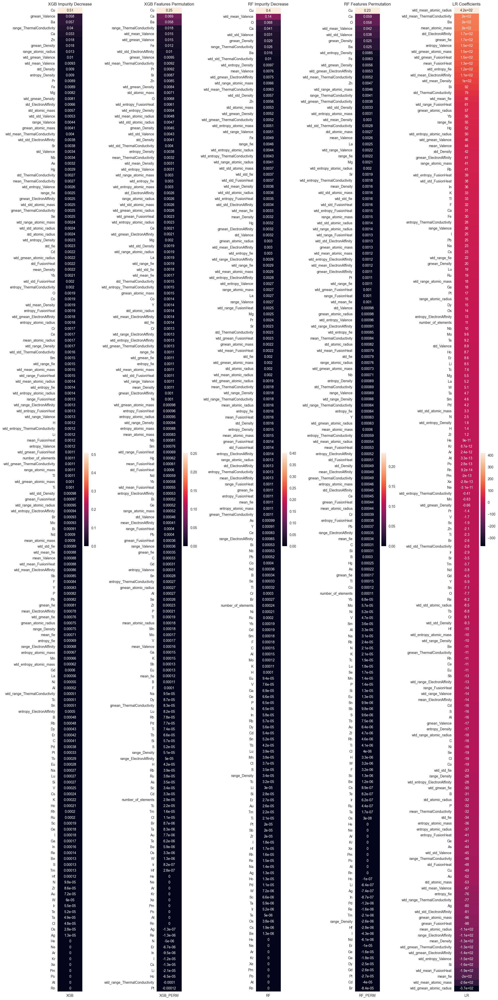

In [ ]:
fig = plt.figure(figsize=(20, 40))
gs = gridspec.GridSpec(1, 5)

# Impurity Decrease of XGBoost
ax = plt.subplot(gs[0])
df = pd.DataFrame(index=[x[0] for x in impurity_decrease_xgb])
df["XGB"] = [x[1] for x in impurity_decrease_xgb]
sns.heatmap(df[["XGB"]], annot=True, ax=ax)
ax.set_title("XGB Impurity Decrease")

# Features Permutation of XGBoost
ax = plt.subplot(gs[1])
df = pd.DataFrame(index=[x[0] for x in features_permutation_xgb])
df["XGB_PERM"] = [x[1] for x in features_permutation_xgb]
sns.heatmap(df[["XGB_PERM"]], annot=True, ax=ax)
ax.set_title("XGB Features Permutation")

# Impurity Decrease of Random Forest
ax = plt.subplot(gs[2])
df = pd.DataFrame(index=[x[0] for x in impurity_decrease_rf])
df["RF"] = [x[1] for x in impurity_decrease_rf]
sns.heatmap(df[["RF"]], annot=True, ax=ax)
ax.set_title("RF Impurity Decrease")

# Features Permutation of Random Forest
ax = plt.subplot(gs[3])
df = pd.DataFrame(index=[x[0] for x in features_permutation_rf])
df["RF_PERM"] = [x[1] for x in features_permutation_rf]
sns.heatmap(df[["RF_PERM"]], annot=True, ax=ax)
ax.set_title("RF Features Permutation")

# Coefficients of Linear Regression
ax = plt.subplot(gs[4])
df = pd.DataFrame(index=[x[0] for x in coefs_lr])
df["LR"] = [x[1] for x in coefs_lr]
sns.heatmap(df[["LR"]], annot=True, ax=ax)
ax.set_title("LR Coefficients")

plt.tight_layout()
plt.show()

# Results


|   |   |
|---|---|
|Best Model| **XGBoost**|
|Preprocessing| **None**|
| R^2| **0.931** |
| MSE | **78.09** |
| Model Parameters | n_estimators: 450 <br> learning_rate: 0.15 <br> max_depth: 6 <br> min_child_weight: 3 <br> gamma: 0.5 <br> subsample: 1.0 <br> colsample_bytree: 1.0 <br> reg_lambda: 1.0 <br> reg_alpha: 0.1 <br> |

---
---
## Linear Regression

|   | Best Configuration  |
|---|---|
|Preprocessing| **MinMaxScaling**|
| R^2| **0.754** |
| MSE | **280.11** |

#### Relevant Observations:
- Removing features, via PCA or the highly correlated ones, degrades the performaces of the model

| R^2  | Description  |
|---|---|
| 0.75 | StandardScaling, no preprocessing |
| 0.73 | Only Properties dataset |
| 0.70 | Removing  highly correlated features with ***threshold: >0.85*** |
| 0.62 | PCA with ***threshold: 0.95*** |
| 0.59 | Only Formula dataset |
| 0.59 | PCA with ***threshold: 0.85*** |


---
---
## Random Forest

|   |  Best Configuration |
|---|---|
|Preprocessing| **Removing the highly correlated features + Normalization Max + MinMaxScaling**|
| R^2| **0.928** |
| MSE | **82.13** |
| Parameters: | max_samples: 0.66 <br> n_estimators: 200 <br> max_depth: 25 <br> max_features: 0.6 <br> ccp_alpha: 0 <br> **corr_threshold: 0.99**|

#### Relevant Observations:

- The best configuration, with **corr_threshold: 0.99**, has only 5 features removed, remaining a total of 162 features. In fact, almost identical results are obtained without removing those features.
- Looking at the ***max_features*** parameter, each one of the best configurations has a different value
- Looking at the ***max_depth*** parameter, the model generally performs better with values between 25 and 35

| R^2  | Description  |
|---|---|
| 0.92 | No preprocessing and with ***max_depth: >15*** <br> StandardScaling <br> Only Properties <br> Only Formula with ***max_samples: 0.66*** <br> Removing highly correlated features with ***threshold: >0.85*** |
| 0.90 | PCA and with ***ccp_alpha: 0.1*** |
| 0.85 | PCA and with ***ccp_alpha: 0***  |
| 0.82 | No preprocessing and with ***max_depth: 5*** |

---
---
## XGBoost

|   |  Best Configuration |
|---|---|
|Preprocessing| **Nothing**|
| R^2| **0.931** |
| MSE | **78.09** |
| Parameters: | n_estimators: 450 <br> learning_rate: 0.15 <br> max_depth: 6 <br> min_child_weight: 3 <br> gamma: 0.5 <br> subsample: 1.0 <br> colsample_bytree: 1.0 <br> reg_lambda: 1.0 <br> reg_alpha: 0.1 <br> |

#### Relevant Observations:
- The model alone has the best outcome, but it needed a fine parameter tuning. The same results can be obtained with the 'classical' preprocessing techniques
- Each preprocess technique varies a lot the result, mainly depending on the XGBoost parameters
- In general, it appears that more ***subsampling*** and more ***column sampling*** gives better results
- The default ***max_depth: 6*** is the best option
- Varying the ***learning_rate*** between 0.15 and 0.20 gives the best results


| R^2  | Description  |
|---|---|
| 0.93 | MinMaxScaling <br> StandardScaling |
| 0.92 | Only Formula <br> Only Properties <br> Removing high correlated features|
| 0.91 | StandardScaling + PCA |

---
---
## KNN

|   |  Best Configuration |
|---|---|
|Preprocessing| **Removing the highly correlated features + Normalization Max + MinMaxScaling**|
| R^2| **0.920** |
| MSE | **91.17** |
| Parameters: | n_neighbors: 5 <br> weights: distance <br> metric: cityblock <br> corr_threshold: 0.95 |

#### Relevant Observations:

- Each preprocess technique varies a lot the result, mainly depending on the KNN parameters
- The best configuration, with **corr_threshold: 0.95**, has only 5 features removed, remaining a total of 162 features. In fact, almost identical results are obtained without removing those features.
- The best ***n_neighbors*** is around 6
- The cosine and cityblocks are the best ***metrics***
- The distance ***weight*** is farmost the best option

| R^2  | Description  |
|---|---|
| 0.92 | MinMaxScaling <br> StandardScaling <br> Only Formula <br> Removing high correlated features|
| 0.91 | StandardScaling + PCA |
| 0.90 | Only Properties <br> No preprocessing|

---
---
## SVR

|   |  Best Configuration |
|---|---|
|Preprocessing| **Removing the highly correlated features + StandardScaling**|
| R^2| **0.785** |
| MSE | **244.465** |
| Parameters: | kernel: rbf <br> epsilon: 1 <br> tol: 0.1 <br> C: 1 <br> max_iter: 100000 <br> corr_threshold: 0.99 |

#### Relevant Observations:

- Plain SVR without hyperparameter tuning can result in R2=-22000 or worse
- Each preprocess technique varies a lot the result, mainly depending on the SVR parameters
- The best configuration, with **corr_threshold: 0.99**, has only 5 features removed, remaining a total of 162 features. In fact, almost identical results are obtained without removing those features.
- The real gamechanger is the StandardScaling
- The best ***n_neighbors*** is around 6
- The cosine and cityblocks are the best ***metrics***
- The distance ***weight*** is far most the best option

| R^2  | Description  |
|---|---|
| 0.78 | StandardScaling <br> StandardScaling + PCA |
| 0.76 | MinMaxScaling |
| 0.71 | Only Formula |
| 0.68 | Removing high correlated features + MinMaxScaler |
| 0.45 | Only Properties |
| < 0.45 | No preprocessing |

---
---
# Features Importance
- The following heatmap displays:
    - the *coefficients* of the Linear Regression model
    - the *feature importance* based on *mean decrease in impurity*, of Random Forest and XGBoost models
    - the *feature importance* based on *feature permutation*, of Random Forest and XGBoost models
- It's important to remember that these measures do not necessarily imply a causal relationship between the features and the target. They only capture the patterns learned by the model from the data
- The most "important" features are both elements (features from Formula dataset) and properties (from the Properties dataset): ***Cu, Ca, Ba, O, range_ThermalConductivity, Valence, ...***
- For the LR coefficients, are displayed also the most negative features (the full map is available in [2_Features_Importance](https://github.com/RiccardoEvangelisti/Evangelisti-Critical-temperature-of-superconductors/blob/main/2_Features_Importance.ipynb) notebook)


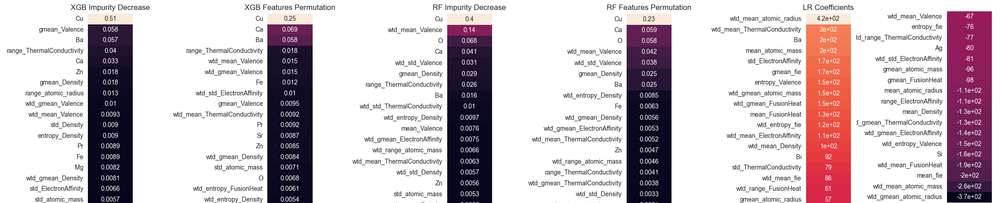